In [20]:
import warnings
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [34]:
students = pd.read_csv("../data/6-student_merged.csv", sep=";", dtype={'from_hei': "string", 'to_hei': "string", 'level': 'category', 'language:': "category",
                       'year': "category", 'gender': "category", 'nationality': "category", 'previous': "category", 'qualification': "category", 'languageprep': "category"})

#Remove white spaces
students['from_hei'] = students['from_hei'].str.replace(" ", "_")
students['to_hei'] = students['to_hei'].str.replace(" ", "_")


print(students.dtypes)


from_hei           string
to_hei             string
age                 int64
gender           category
nationality      category
subject             int64
subject1            int64
level            category
yearsprior          int64
duration          float64
credit              int64
language           object
languageprep     category
sevsupp           float64
grant             float64
previous         category
qualification    category
year             category
distance          float64
direction         float64
dtype: object


In [35]:
print(students)

from_hei        to_hei  age gender nationality  subject  \
0        D__KONSTAN01     UK_BATH01   25      M          DE      310   
1        D__KONSTAN01   F__PARIS007   24      M          DE      461   
2        D__KONSTAN01  F__MARSEIL16   23      M          DE      314   
3        D__KONSTAN01  E__CORDOBA01   24      F          DE      222   
4        EE_TALLINN04    SF_LAHTI11   22      M          EE       34   
...               ...           ...  ...    ...         ...      ...   
1162424  TR_ISTANBU25   PL_KRAKOW03    0      M           0       48   
1162425  TR_ISTANBU25  S__TROLLHA01    0      M           0        5   
1162426  TR_ISTANBU25  S__TROLLHA01    0      M           0        5   
1162427  TR_ISTANBU25  UK_LONDON134    0      F           0       34   
1162428  TR_ISTANBU25  E__CORDOBA01    0      F           0      222   

         subject1 level  yearsprior  duration  credit language languageprep  \
0               3     1           2       4.0      27       EN       

In [56]:
G = nx.Graph()
print("# of nodes: ", G.number_of_nodes())
print("# of edges: ", G.number_of_edges())

# of nodes:  0
# of edges:  0


In [57]:
#Get nodes (hei codes)
nodes_out = set(students.from_hei.unique())
nodes_in = set(students.to_hei.unique())
nodes = nodes_out.union(nodes_in)
print(len(list(nodes)))

#G.add_nodes_from(nodes_for_adding = list(nodes))

2841


In [58]:
#Get edges
'''
Weighted
Directed
'''
#print(nodes)
grouped_st = students.groupby(['from_hei', 'to_hei'])#.size()
#print(grouped_st)
for key, el in grouped_st:
    #print(len(el)
    #Node for key[0], key[1], len(el)
    G.add_edge(key[0], key[1], weight=len(el))


In [59]:
#Print g info
print("# of nodes: ", G.number_of_nodes())
print("# of edges: ", G.number_of_edges())

# of nodes:  3292
# of edges:  104226


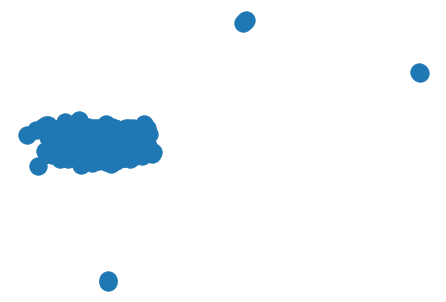

In [23]:
# plot graph
plt.figure()

with warnings.catch_warnings():
    # catch matplotlib deprecation warning
    warnings.simplefilter('ignore')
    nx.draw(
        G,
        pos=nx.spring_layout(G, seed=42)
    )

plt.show()

In [41]:
#Write graph as an edge list

nx.write_weighted_edgelist(G, '../graphs/edge_list.csv')